## EDA

The main goal of EDA is to explore the datasets, find interesting patterns in the data and perform some descriptive and inferential statistics. Individual features will be analyzed and processed in Data Wrangling step.

## Importing Basic Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings(action='ignore')

## General Column Information 

In [ ]:
column_description=pd.read_csv('/content/drive/My Drive/Colab Notebooks/capstone two/home-credit-default-risk/HomeCredit_columns_description.csv', encoding= 'unicode_escape', index_col='Row').drop('Unnamed: 0', axis=1)
column_description.tail()

,Table,Description,Special
Row,,,
NUM_INSTALMENT_NUMBER,installments_payments.csv,On which installment we observe payment,NaN
DAYS_INSTALMENT,installments_payments.csv,When the installment of previous credit was su...,time only relative to the application
DAYS_ENTRY_PAYMENT,installments_payments.csv,When was the installments of previous credit p...,time only relative to the application
AMT_INSTALMENT,installments_payments.csv,What was the prescribed installment amount of ...,NaN
AMT_PAYMENT,installments_payments.csv,What the client actually paid on previous cred...,NaN


In [ ]:
column_description.loc['TARGET'][1]

'Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)'

## 1) Data Exploration: Application_Train


## Application Train
 This is a main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating 0: the loan was repaid or 1: the loan was not repaid.

In [ ]:
df=pd.read_csv('/content/drive/My Drive/Colab Notebooks/capstone two/home-credit-default-risk/application_train.csv')
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,...,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,...,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,...,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,NaN,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,NaN,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   SK_ID_CURR                    307511 non-null  int64  
 1   TARGET                        307511 non-null  int64  
 2   NAME_CONTRACT_TYPE            307511 non-null  object 
 3   CODE_GENDER                   307511 non-null  object 
 4   FLAG_OWN_CAR                  307511 non-null  object 
 5   FLAG_OWN_REALTY               307511 non-null  object 
 6   CNT_CHILDREN                  307511 non-null  int64  
 7   AMT_INCOME_TOTAL              307511 non-null  float64
 8   AMT_CREDIT                    307511 non-null  float64
 9   AMT_ANNUITY                   307499 non-null  float64
 10  AMT_GOODS_PRICE               307233 non-null  float64
 11  NAME_TYPE_SUITE               306219 non-null  object 
 12  NAME_INCOME_TYPE              307511 non-nu

***Remarks:***
*   There are total 307,511 rows representing the information of each loans and 120 features. 

*   The response variable:**TARGET** defines if the client had payment difficulties, 1 representing the client had a late payment more than at least one installments of the loan (loan defaulted) and 0 as loan repaid.
*   Many features contains null values, this will be explored in detail later.

### 1.2 Target Variable Distribution

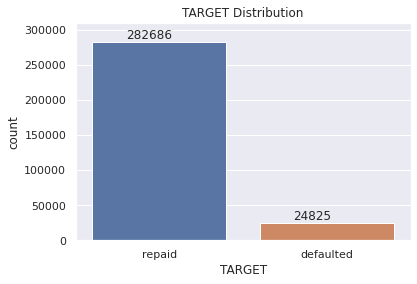

In [ ]:
sns.set()
ax=sns.countplot(df['TARGET'])
plt.xticks([1,0],['defaulted', 'repaid'])
plt.ylim([0,310000])
plt.title('TARGET Distribution')

for p in ax.patches:
        ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.2, p.get_height()+5000))


***Data is highly imbalanced.*** There are about 91% loans (about 283K) with target = 0, While only 9% (about 25K) of the total loans indicated having problems in repaying the loan.

### 1.3 Missing Value Analysis

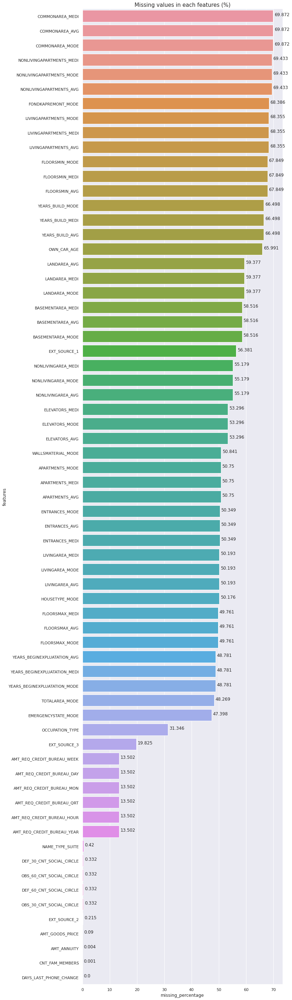

In [ ]:
# missing value calculation
missing_values=pd.DataFrame(df.isnull().sum()*100/len(df)).reset_index()
missing_values.columns=['features','missing_percentage']
missing_values=missing_values[missing_values['missing_percentage']>0].sort_values(by='missing_percentage', ascending=False).reset_index(drop=True)

# plot of missing values in each features
plt.figure(figsize=(10,50))
ax=sns.barplot(y="features", x="missing_percentage", data=missing_values, orient='h')
for p in ax.patches:
        x = p.get_x() + p.get_width() + 0.5
        y = p.get_y() + p.get_height()/2
        ax.annotate(round(p.get_width(),3), (x, y))

_=ax.set_title('Missing values in each features (%)', fontsize=15)

#### Missing value distribution visualized by missingno package

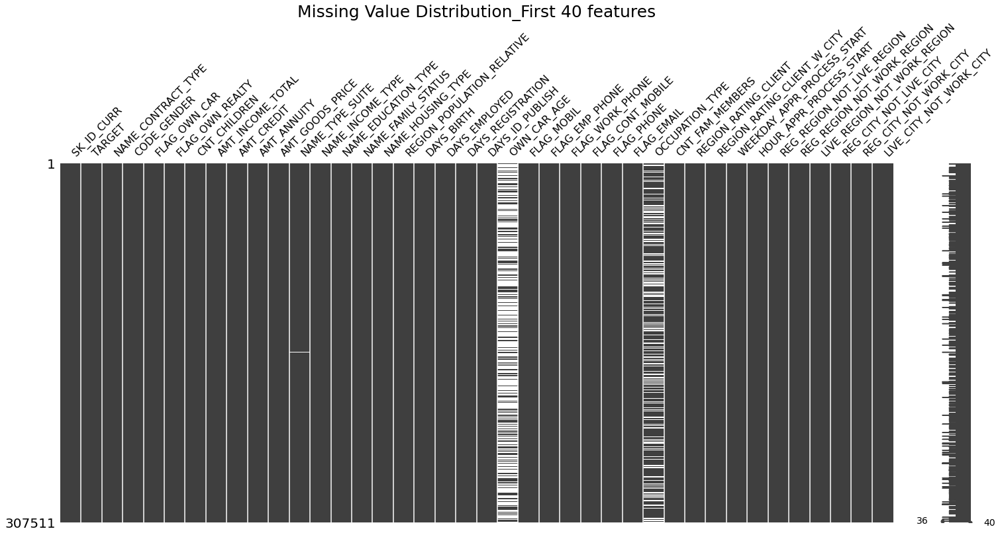

In [ ]:
import missingno as msno 
_=msno.matrix(df.iloc[:,:40])
_=plt.title('Missing Value Distribution_First 40 features', fontsize=25)

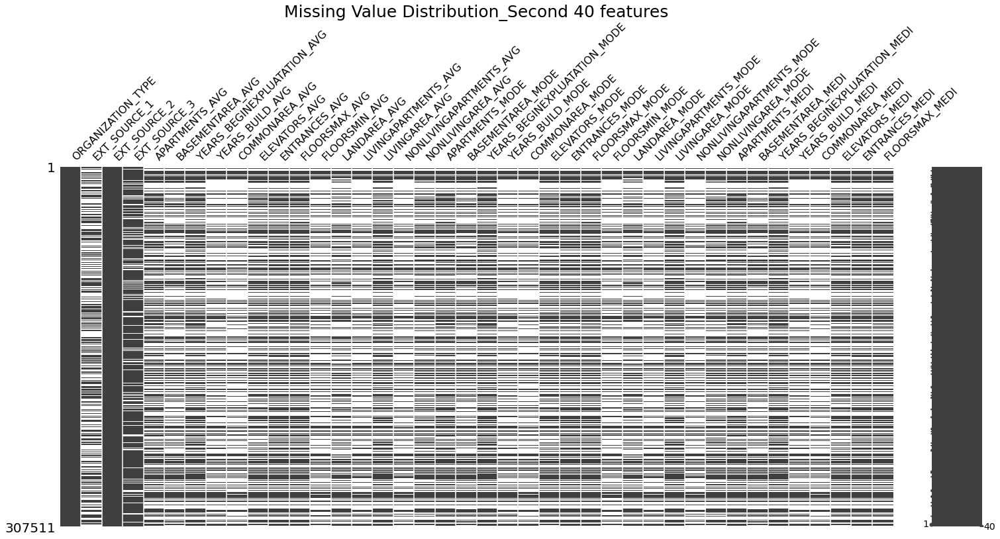

In [ ]:
msno.matrix(df.iloc[:,40:80])
_=plt.title('Missing Value Distribution_Second 40 features', fontsize=25)

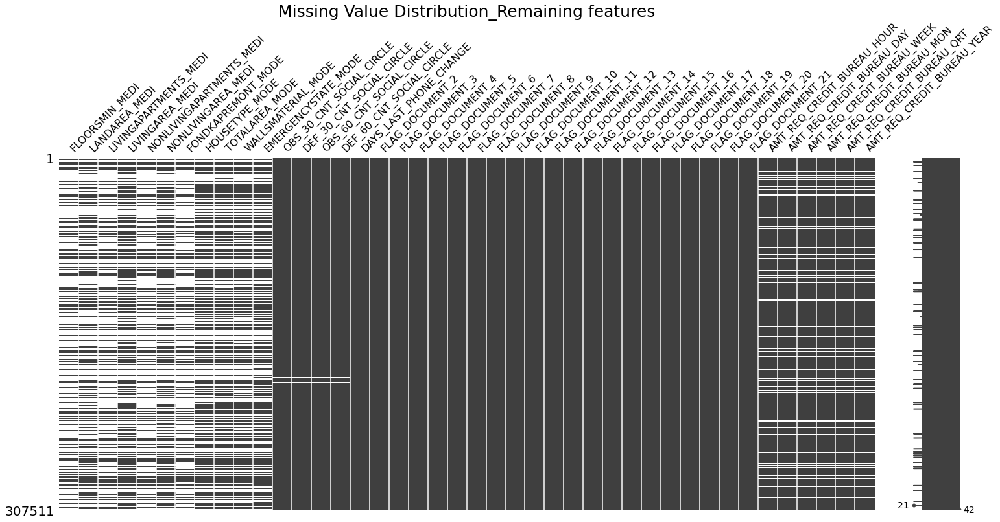

In [ ]:
msno.matrix(df.iloc[:,80:])
_=plt.title('Missing Value Distribution_Remaining features', fontsize=25)

***Remarks***
*   66 features have missing values.
*   40 features have more than 50% missing values and 9 features less than 1%.
*   Features having the information of the building where the applicant lives: Commonarea_med, commonarea_Avg and Commonarea_Mode contains high fraction of missing values about 70%.
*    similarly, Avg, Med and Mode Features describing the building where the client lives are missing in high fraction.

In [ ]:
missing_values=pd.DataFrame(df.isnull().sum()*100/len(df)).reset_index()
missing_values.columns=['features','missing_percentage']
missing_values=missing_values[missing_values['missing_percentage']>0].sort_values(by='missing_percentage', ascending=False).reset_index(drop=True)
missing_values.tail(10)

,features,missing_percentage
57,NAME_TYPE_SUITE,0.420148
58,DEF_30_CNT_SOCIAL_CIRCLE,0.332021
59,OBS_60_CNT_SOCIAL_CIRCLE,0.332021
60,DEF_60_CNT_SOCIAL_CIRCLE,0.332021
61,OBS_30_CNT_SOCIAL_CIRCLE,0.332021
62,EXT_SOURCE_2,0.214626
63,AMT_GOODS_PRICE,0.090403
64,AMT_ANNUITY,0.003902
65,CNT_FAM_MEMBERS,0.000650
66,DAYS_LAST_PHONE_CHANGE,0.000325


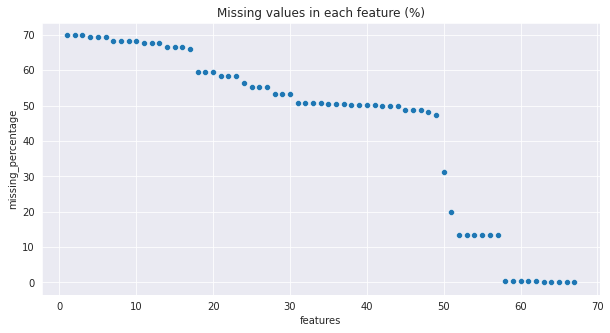

In [ ]:
sns.set_style('darkgrid')
plt.figure(figsize=(10,5))
sns.scatterplot(x=np.arange(1,68,1),y="missing_percentage", data=missing_values) 
_=plt.title('Missing values in each feature (%)')
_=plt.xlabel('features')
plt.savefig('missing values.jpg')

## 2) Descriptive Statistics

### 2.1 Data types

In [ ]:
# datatypes
numerical_features = list(df._get_numeric_data().columns)
categorical_features = list(df.columns.difference(numerical_features))
print('total no. of numerical features: ' + str(len(numerical_features)))
print('Numerical_features are')
print(numerical_features)
print('\n')
print('total no. of categorical features: ' + str(len(categorical_features)))
print('Categorical_features are')
print(categorical_features)

total no. of numerical features: 106
Numerical_features are
['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE'

#### Features with less unique values

In [ ]:
unique_counts=df[numerical_features].nunique()
print('No. of features having less than 3 unique values: {})'.format(len(unique_counts[unique_counts.values<3].index.tolist())))
print('No. of features having less than 5 unique values: {})'.format(len(unique_counts[unique_counts.values<5].index.tolist())))

No. of features having less than 3 unique values: 33)
No. of features having less than 5 unique values: 35)


In [ ]:
unique_counts[unique_counts.values==2]

TARGET                         2
FLAG_MOBIL                     2
FLAG_EMP_PHONE                 2
FLAG_WORK_PHONE                2
FLAG_CONT_MOBILE               2
FLAG_PHONE                     2
FLAG_EMAIL                     2
REG_REGION_NOT_LIVE_REGION     2
REG_REGION_NOT_WORK_REGION     2
LIVE_REGION_NOT_WORK_REGION    2
REG_CITY_NOT_LIVE_CITY         2
REG_CITY_NOT_WORK_CITY         2
LIVE_CITY_NOT_WORK_CITY        2
FLAG_DOCUMENT_2                2
FLAG_DOCUMENT_3                2
FLAG_DOCUMENT_4                2
FLAG_DOCUMENT_5                2
FLAG_DOCUMENT_6                2
FLAG_DOCUMENT_7                2
FLAG_DOCUMENT_8                2
FLAG_DOCUMENT_9                2
FLAG_DOCUMENT_10               2
FLAG_DOCUMENT_11               2
FLAG_DOCUMENT_12               2
FLAG_DOCUMENT_13               2
FLAG_DOCUMENT_14               2
FLAG_DOCUMENT_15               2
FLAG_DOCUMENT_16               2
FLAG_DOCUMENT_17               2
FLAG_DOCUMENT_18               2
FLAG_DOCUM

***Most of the numerical features are boolen and some of these features might be categorial features labeled with numeric values. Hence, these features should be converted to categorical features.***

In [ ]:
# converting numerical features with less than 5 unique counts to a categorical feature 
df[unique_counts[unique_counts.values<5].index.tolist()]=df[unique_counts[unique_counts.values<5].index.tolist()].astype('object')

numerical_features = list(df.drop('SK_ID_CURR', axis=1)._get_numeric_data().columns)
categorical_features = list(df.drop('SK_ID_CURR', axis=1).columns.difference(numerical_features))
print('Total no. of numerical features: ' + str(len(numerical_features)))
print('Numerical_features are')
print(numerical_features)
print('\n')
print('Total no. of categorical features: ' + str(len(categorical_features)))
print('Categorical_features are')
print(categorical_features)


Total no. of numerical features: 70
Numerical_features are
['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'CNT_FAM_MEMBERS', 'HOUR_APPR_PROCESS_START', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 

***Basic overview of the descriptive statistics***

***Separation of df into numerical and categorical features.***

In [ ]:
df_num=df[numerical_features]
df_cat=df[categorical_features]

In [ ]:
#descriptive statistics for numerical features
df.describe()

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,CNT_FAM_MEMBERS,HOUR_APPR_PROCESS_START,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307509.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,2.152665,12.063419,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.977752,0.755746,0.044595,0.078078,0.149213,0.225897,0.231625,0.067169,0.101954,0.108607,0.008651,0.028236,0.102547,1.422245,0.143421,1.405292,0.100049,-962.858788,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,3522.886321,1509.450419,11.944812,0.910682,3.265832,0.211062,1.910602e-01,0.194844,0.10824,0.082438,0.059223,0.113280,0.076036,0.134576,0.100049,0.144641,0.161380,0.081184,0.092576,0.110565,0.047732,0.069523,0.107936,0.084307,0.064575,0.110111,0.074445,0.132256,0.100977,0.143709,0.161160,0.081750,0.097880,0.111845,0.046276,0.070254,0.109076,0.082179,0.059897,0.112066,0.076144,0.134467,0.100368,0.145067,0.161934,0.082167,0.093642,0.112260,0.047415,0.070166,0.107462,2.400989,0.446698,2.379803,0.362291,826.808487,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,-24672.000000,-7197.000000,0.000000,1.000000,0.000000,0.014568,8.173617e-08,0.000527,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0

***Distribution of Numerical Features and their interaction with other features***

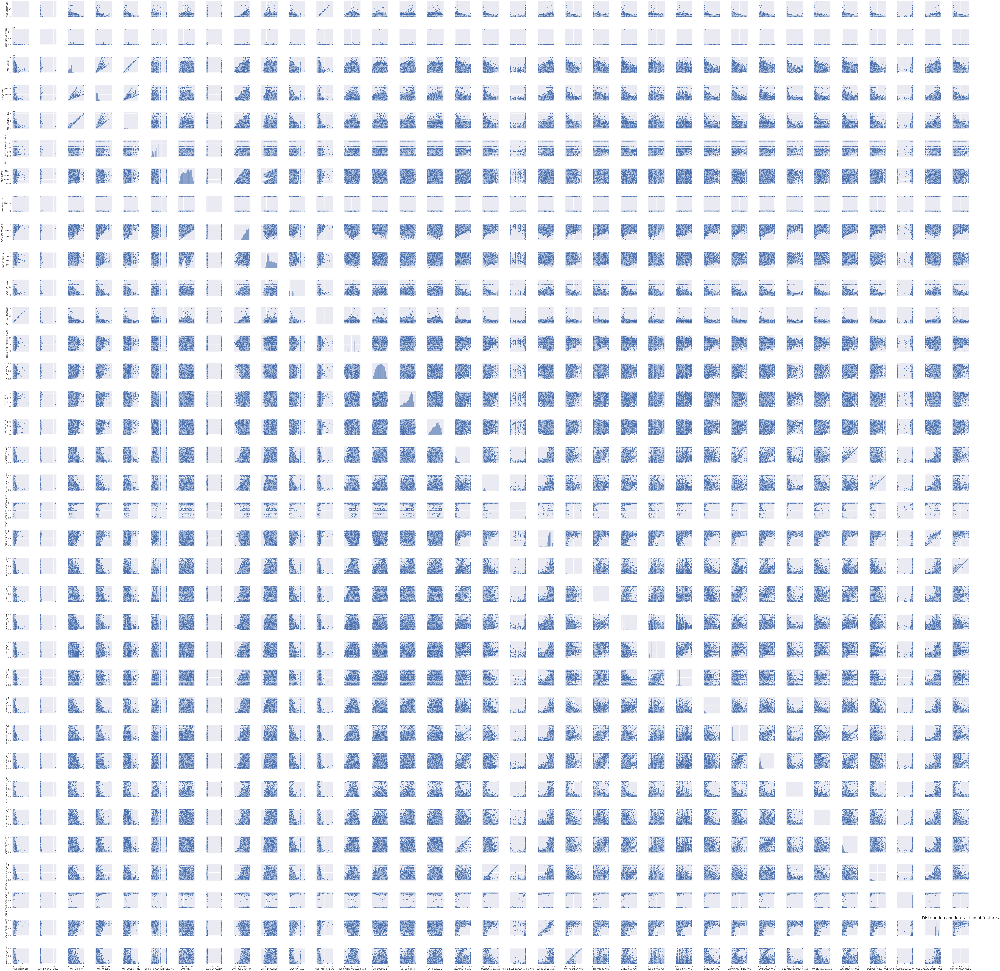

In [ ]:
sns.pairplot(df_num.iloc[:,:35])

**Difficult to visualize because of the large number of the features.**

### 2.2 Distribution of individual features: Skewness and Kurtosis

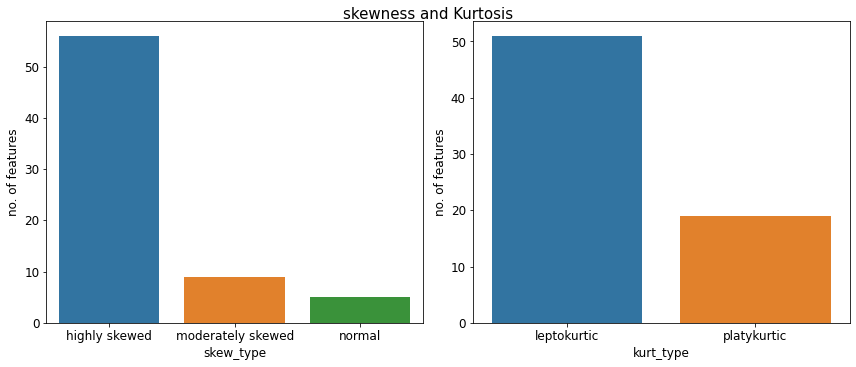

In [ ]:
skew=pd.DataFrame(df_num.skew()).reset_index()
skew.columns=['features', 'skewness']
kurt=pd.DataFrame(df_num.kurtosis()).reset_index()
kurt.columns=['features', 'kurtosis']
skew_kurt=skew.merge(kurt,on='features')


skew_type=[]
for skewness in skew_kurt['skewness']: 
  if skewness<-1:
    skew='highly skewed'
  elif skewness<=-0.5:
    skew='moderately skewed'
  elif skewness<=0.5:
    skew='normal'
  elif skewness<=1:
    skew='moderately skewed'
  else:
    skew='highly skewed'
  skew_type.append(skew)


kurt_type=[]
for kurtosis in skew_kurt['kurtosis']: 
  if kurtosis == 3:
    kurt='normal'
  if kurtosis>3:
    kurt='leptokurtic'
  else:
    kurt='platykurtic'
  kurt_type.append(kurt)


skew_kurt['skew_type']=skew_type
skew_kurt['kurt_type']=kurt_type

skew_kurt.head()


fig, (ax1,ax2) =plt.subplots(nrows=1,ncols=2,figsize=(12,5))
sns.countplot(x=skew_kurt['skew_type'], ax=ax1,order=['highly skewed','moderately skewed','normal'])
ax1.tick_params(labelsize=12)
ax1.set_xlabel('skew_type', size=12)
ax1.set_ylabel('no. of features', size=12)

sns.countplot(x=skew_kurt['kurt_type'], ax=ax2)
ax2.tick_params(labelsize=12)
ax2.set_xlabel('kurt_type', size=12)
ax2.set_ylabel('no. of features', size=12)

plt.suptitle("skewness and Kurtosis", y=1.01,fontsize=15)
fig.tight_layout()

plt.savefig('sk_curt.jpg')

In [ ]:
skew_kurt['skew_type'].value_counts()

highly skewed        56
moderately skewed     9
normal                5
Name: skew_type, dtype: int64

In [ ]:
skew_kurt['kurt_type'].value_counts()

leptokurtic    51
platykurtic    19
Name: kurt_type, dtype: int64

**More than 50 numerical features are highly skewed and highly peaked, whereas just 5 features are normally distributed** 

**Top ten highly skewed numerical features:** 

In [ ]:
skew_kurt.sort_values(by='skewness', ascending=False).head(10)['features']

,features,skewness,kurtosis,skew_type,kurt_type
1,AMT_INCOME_TOTAL,391.559654,191786.554381,highly skewed,leptokurtic
68,AMT_REQ_CREDIT_BUREAU_QRT,134.365776,43707.464752,highly skewed,leptokurtic
65,AMT_REQ_CREDIT_BUREAU_DAY,27.043505,1151.867594,highly skewed,leptokurtic
42,NONLIVINGAPARTMENTS_MODE,16.251819,309.726947,highly skewed,leptokurtic
56,NONLIVINGAPARTMENTS_MEDI,15.671995,289.492455,highly skewed,leptokurtic
28,NONLIVINGAPARTMENTS_AVG,15.541185,284.730336,highly skewed,leptokurtic
64,AMT_REQ_CREDIT_BUREAU_HOUR,14.534062,254.243620,highly skewed,leptokurtic
59,OBS_30_CNT_SOCIAL_CIRCLE,12.139598,1424.815552,highly skewed,leptokurtic
61,OBS_60_CNT_SOCIAL_CIRCLE,12.070829,1409.704557,highly skewed,leptokurtic
66,AMT_REQ_CREDIT_BUREAU_WEEK,9.293573,166.752230,highly skewed,leptokurtic


**Top ten highly skewed numerical features:** AMT_INCOME_TOTAL,
 AMT_REQ_CREDIT_BUREAU_QRT,
 AMT_REQ_CREDIT_BUREAU_DAY,
 NONLIVINGAPARTMENTS_MODE,
 NONLIVINGAPARTMENTS_MEDI,
 NONLIVINGAPARTMENTS_AVG,
 AMT_REQ_CREDIT_BUREAU_HOUR,
 OBS_30_CNT_SOCIAL_CIRCLE,
 OBS_60_CNT_SOCIAL_CIRCLE,
 AMT_REQ_CREDIT_BUREAU_WEEK

**Visualization of distribution of top 4 highly skewed and peaked features**

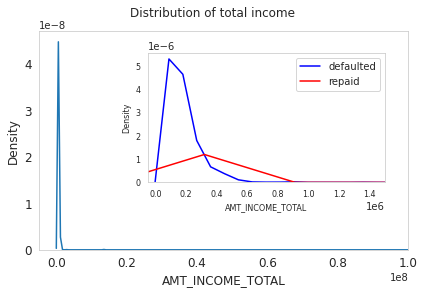

In [ ]:

sns.set_style('whitegrid', {'axes.grid' : False})

fig, ax = plt.subplots(figsize=(6,4))

sns.kdeplot(df['AMT_INCOME_TOTAL'])
ax.tick_params(labelsize=12)
ax.set_xlabel('AMT_INCOME_TOTAL', size=12)
ax.set_ylabel('Density', size=12)
ax.set_xlim(-0.5e7,1e8)

# inset
inset_ax = fig.add_axes([0.35, 0.40, 0.55, 0.45]) # X, Y, width, height

df0=df[df['TARGET']==0]
df1=df[df['TARGET']==1]

sns.kdeplot(df0['AMT_INCOME_TOTAL'], color='b', Label='defaulted')
sns.kdeplot(df1['AMT_INCOME_TOTAL'], color='r', Label='repaid')
inset_ax.tick_params(labelsize=8)
inset_ax.set_xlabel('AMT_INCOME_TOTAL', size=8)
inset_ax.set_ylabel('Density', size=8)
inset_ax.set_xlim([-0.5e5,1.5e6])
inset_ax.legend()

fig.tight_layout()
plt.suptitle("Distribution of total income", y=1.01,fontsize=12)
plt.savefig('total income')


***Majority of the clients have income less than 1000K. As expected, clients who have difficulty in payment have low annual income than the client who repaid the loan.*** 

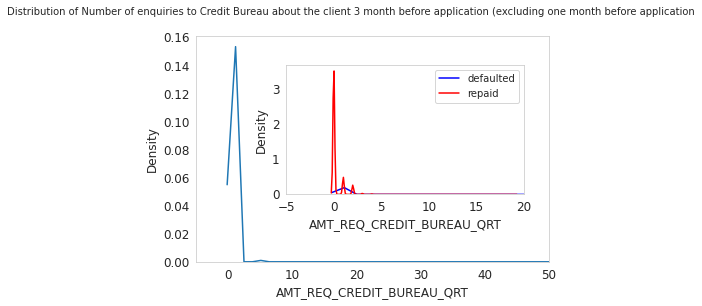

In [ ]:
fig, ax = plt.subplots(figsize=(6,4))
sns.kdeplot(df['AMT_REQ_CREDIT_BUREAU_QRT'])
ax.tick_params(labelsize=12)
ax.set_xlabel('AMT_REQ_CREDIT_BUREAU_QRT', size=12)
ax.set_ylabel('Density', size=12)
ax.set_xlim([-5,50])

# inset
inset_ax = fig.add_axes([0.35, 0.40, 0.55, 0.45]) # X, Y, width, height

df0=df[df['TARGET']==0]
df1=df[df['TARGET']==1]

sns.kdeplot(df0['AMT_REQ_CREDIT_BUREAU_QRT'], color='b', Label='defaulted')
sns.kdeplot(df1['AMT_REQ_CREDIT_BUREAU_QRT'], color='r', Label='repaid')
inset_ax.tick_params(labelsize=12)
inset_ax.set_xlabel('AMT_REQ_CREDIT_BUREAU_QRT', size=12)
inset_ax.set_ylabel('Density', size=12)
inset_ax.set_xlim([-5,20])
inset_ax.legend()

plt.suptitle("Distribution of Number of enquiries to Credit Bureau about the client 3 month before application (excluding one month before application", y=1.05,fontsize=10)

fig.tight_layout()

***Majority of the number of enquiries to Credit Bureau about the client 3 month before application are below 5. In addition majority of the clients who have repaid the loan have very less enquiries than the defaulted clients.***

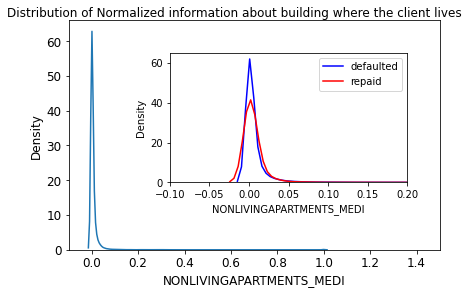

In [ ]:
fig, ax = plt.subplots(figsize=(6,4))

sns.kdeplot(df['NONLIVINGAPARTMENTS_MEDI'])
ax.tick_params(labelsize=12)
ax.set_xlabel('NONLIVINGAPARTMENTS_MEDI', size=12)
ax.set_ylabel('Density', size=12)
ax.set_xlim([-0.1,1.5])

# inset
inset_ax = fig.add_axes([0.35, 0.40, 0.55, 0.45]) # X, Y, width, height

df0=df[df['TARGET']==0]
df1=df[df['TARGET']==1]

sns.kdeplot(df0['NONLIVINGAPARTMENTS_MEDI'], color='b', Label='defaulted')
sns.kdeplot(df1['NONLIVINGAPARTMENTS_MEDI'], color='r', Label='repaid')
inset_ax.tick_params(labelsize=10)
inset_ax.set_xlabel('NONLIVINGAPARTMENTS_MEDI', size=10)
inset_ax.set_ylabel('Density', size=10)
inset_ax.set_xlim([-0.1,0.2])
inset_ax.legend()


fig.tight_layout()
plt.suptitle("Distribution of Normalized information about building where the client lives", y=1.01,fontsize=12)
plt.savefig('building_info')


**Majority of the information of the building where clients lives lies near 0, and there is not any clear pattern between the normalized info and loan repayment ability.**

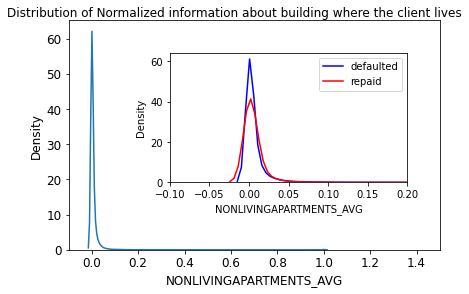

In [ ]:
fig, ax = plt.subplots(figsize=(6,4))

sns.kdeplot(df['NONLIVINGAPARTMENTS_AVG'])
ax.tick_params(labelsize=12)
ax.set_xlabel('NONLIVINGAPARTMENTS_AVG', size=12)
ax.set_ylabel('Density', size=12)
ax.set_xlim([-0.1,1.5])

# inset
inset_ax = fig.add_axes([0.35, 0.40, 0.55, 0.45]) # X, Y, width, height

df0=df[df['TARGET']==0]
df1=df[df['TARGET']==1]

sns.kdeplot(df0['NONLIVINGAPARTMENTS_AVG'], color='b', Label='defaulted')
sns.kdeplot(df1['NONLIVINGAPARTMENTS_AVG'], color='r', Label='repaid')
inset_ax.tick_params(labelsize=10)
inset_ax.set_xlabel('NONLIVINGAPARTMENTS_AVG', size=10)
inset_ax.set_ylabel('Density', size=10)
inset_ax.set_xlim([-0.1,0.2])
inset_ax.legend()


fig.tight_layout()
plt.suptitle("Distribution of Normalized information about building where the client lives", y=1.01,fontsize=12)
plt.savefig('building_info_avg.jpg')


**Majority of the information of the building where client lives lies near 0, and there is not any clear pattern between the normalized info and loan repayment ability.**

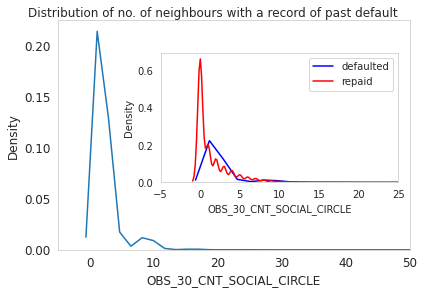

In [ ]:
sns.set_style('whitegrid', {'axes.grid' : False})
fig, ax = plt.subplots(figsize=(6,4))

sns.kdeplot(df['OBS_30_CNT_SOCIAL_CIRCLE'])
ax.tick_params(labelsize=12)
ax.set_xlabel('OBS_30_CNT_SOCIAL_CIRCLE', size=12)
ax.set_ylabel('Density', size=12)
ax.set_xlim([-5,50])

# inset
inset_ax = fig.add_axes([0.38, 0.40, 0.55, 0.45]) # X, Y, width, height

df0=df[df['TARGET']==0]
df1=df[df['TARGET']==1]

sns.kdeplot(df0['OBS_30_CNT_SOCIAL_CIRCLE'], color='b', Label='defaulted')
sns.kdeplot(df1['OBS_30_CNT_SOCIAL_CIRCLE'], color='r', Label='repaid')
inset_ax.tick_params(labelsize=10)
inset_ax.set_xlabel('OBS_30_CNT_SOCIAL_CIRCLE', size=10)
inset_ax.set_ylabel('Density', size=10)
inset_ax.set_xlim([-5,25])
inset_ax.legend()


fig.tight_layout()
plt.suptitle("Distribution of no. of neighbours with a record of past default", y=1.01,fontsize=12)
plt.savefig('neighbour_default.jpg')


***Majority of the clients have less than 10 defaults. As expected the clients surrounding have low defaults for repaid clients and higher no. of defaults for defaulted clients.***

**Outlier's visualization of top 4 highly skewed and peaked features**

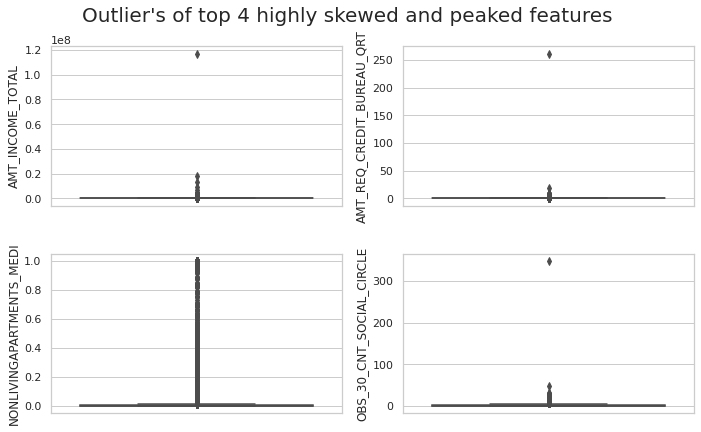

In [ ]:
sns.set_theme(style="whitegrid")
fig, axes =plt.subplots(nrows=2,ncols=2,figsize=(10,6))
sns.boxplot(y='AMT_INCOME_TOTAL',data=df,ax=axes[0,0])
sns.boxplot(y='AMT_REQ_CREDIT_BUREAU_QRT', data=df,ax=axes[0,1])
sns.boxplot(y='NONLIVINGAPARTMENTS_MEDI',data=df, ax=axes[1,0])
sns.boxplot(y='OBS_30_CNT_SOCIAL_CIRCLE',data=df,ax=axes[1,1])


plt.suptitle("Outlier's of top 4 highly skewed and peaked features", y=1.01,fontsize=20)
fig.tight_layout()

plt.savefig('boxplot.jpg')

**There are significant number of outliers, these outliers will be removed during Data cleaning.**

##3) Feature Importance by WOE and IV

In [ ]:
#pip install xverse

X=df.drop(['SK_ID_CURR','TARGET'], axis=1)
y=df['TARGET'].values


from xverse.transformer import MonotonicBinning

clf = MonotonicBinning(force_bins=10)
clf.fit(X, y)


from xverse.transformer import WOE

clf = WOE()
clf.fit(X, y)

IV=clf.iv_df
IV.columns=['features', 'information_value']

IV=IV.sort_values(by='information_value',ascending=False).reset_index(drop=True)
IV.head(50)

,features,information_value
0,EXT_SOURCE_3,0.269771
1,EXT_SOURCE_2,0.246603
2,EXT_SOURCE_1,0.124016
3,OCCUPATION_TYPE,0.082865
4,DAYS_BIRTH,0.075688
5,ORGANIZATION_TYPE,0.073368
6,NAME_INCOME_TYPE,0.058322
7,REGION_RATING_CLIENT_W_CITY,0.051201
8,NAME_EDUCATION_TYPE,0.050836
9,AMT_GOODS_PRICE,0.049094


#### 3.1 Feature Selection based on IV

***Rules related to Information Value***

| Information Value       | Variable Predictiveness     |
| :------------- | :----------: |
| Less than 0.02	| Not useful for prediction|
| 0.02 to 0.1	| Weak predictive Power|
| 0.1 to 0.3	| Medium predictive Power|
| 0.3 to 0.5	| Strong predictive Power|
| >0.5	|  Suspicious Predictive Power||


In [ ]:
useful_features=IV[(IV['information_value']>0.02) & (IV['information_value']<0.3) ].sort_values(by='information_value',ascending=False).reset_index(drop=True)
print('Total no. of useful features: {}'.format(len(useful_features)))
useful_features 

Total no. of useful features: 50


,features,information_value
0,EXT_SOURCE_3,0.269771
1,EXT_SOURCE_2,0.246603
2,EXT_SOURCE_1,0.124016
3,OCCUPATION_TYPE,0.082865
4,DAYS_BIRTH,0.075688
5,ORGANIZATION_TYPE,0.073368
6,NAME_INCOME_TYPE,0.058322
7,REGION_RATING_CLIENT_W_CITY,0.051201
8,NAME_EDUCATION_TYPE,0.050836
9,AMT_GOODS_PRICE,0.049094


In [ ]:
weak_features=IV[(IV['information_value']>0.02) & (IV['information_value']<=0.1) ].sort_values(by='information_value',ascending=False).reset_index(drop=True)
print('Total no. of weak feature: {}'.format(len(weak_features)))
weak_features 

Total no. of weak feature: 47


,features,information_value
0,OCCUPATION_TYPE,0.082865
1,DAYS_BIRTH,0.075688
2,ORGANIZATION_TYPE,0.073368
3,NAME_INCOME_TYPE,0.058322
4,REGION_RATING_CLIENT_W_CITY,0.051201
5,NAME_EDUCATION_TYPE,0.050836
6,AMT_GOODS_PRICE,0.049094
7,REGION_RATING_CLIENT,0.048317
8,DAYS_EMPLOYED,0.043808
9,DAYS_LAST_PHONE_CHANGE,0.040407


In [ ]:
medium_features=IV[(IV['information_value']>0.1) & (IV['information_value']<=0.3) ].sort_values(by='information_value',ascending=False).reset_index(drop=True)
print('Total no. of weak feature: {}'.format(len(medium_features)))
medium_features 

Total no. of weak feature: 3


,features,information_value
0,EXT_SOURCE_3,0.269771
1,EXT_SOURCE_2,0.246603
2,EXT_SOURCE_1,0.124016


In [ ]:
predictive_power=['Not useful', 'Weak','Medium', 'Strong', 'Suspicious']
feature_count=[70,47,3,0,0]
IV_analysis=pd.DataFrame(list(zip(predictive_power,feature_count)), columns=['predictive_power','feature_count'])
IV_analysis

,predictive_power,feature_count
0,Not useful,70
1,Weak,47
2,Medium,3
3,Strong,0
4,Suspicious,0


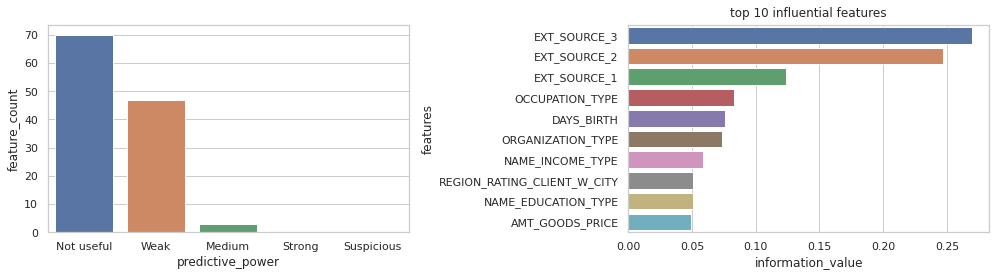

In [ ]:
fig,(ax1,ax2) =plt.subplots(nrows=1,ncols=2,figsize=(14,4))

sns.barplot(x='predictive_power', y='feature_count',data=IV_analysis, orient='v', ax=ax1)
plt.title("predictive power of the features", y=1.01,fontsize=12)
sns.barplot(x='information_value', y='features',data=useful_features.head(10), orient='h',ax=ax2)


plt.title("top 10 influential features", y=1.01,fontsize=12)

fig.tight_layout()

plt.savefig('predictive.jpg')

In [ ]:
not_useful_features=IV[(IV['information_value']<0.02) ].sort_values(by='information_value',ascending=False).reset_index(drop=True)
print('Total no. of non_useful features: {}'.format(len(not_useful_features)))
not_useful_features 

Total no. of non_useful features: 70


,features,information_value
0,OWN_CAR_AGE,1.977531e-02
1,REGION_POPULATION_RELATIVE,1.955524e-02
2,FLOORSMIN_MEDI,1.844211e-02
3,FLOORSMIN_AVG,1.844042e-02
4,FLOORSMIN_MODE,1.793580e-02
...,...,...
65,FLAG_DOCUMENT_20,6.161632e-07
66,FLAG_DOCUMENT_4,7.821510e-09
67,FLAG_DOCUMENT_10,6.131869e-10
68,FLAG_DOCUMENT_12,5.005563e-11


**Only 50 features are influential to predict the target.**

### 3.2 Top-five influential features

In [ ]:
top_5_features=useful_features['features'].head().values.tolist()
top_5_features

['EXT_SOURCE_3',
 'EXT_SOURCE_2',
 'EXT_SOURCE_1',
 'OCCUPATION_TYPE',
 'DAYS_BIRTH']

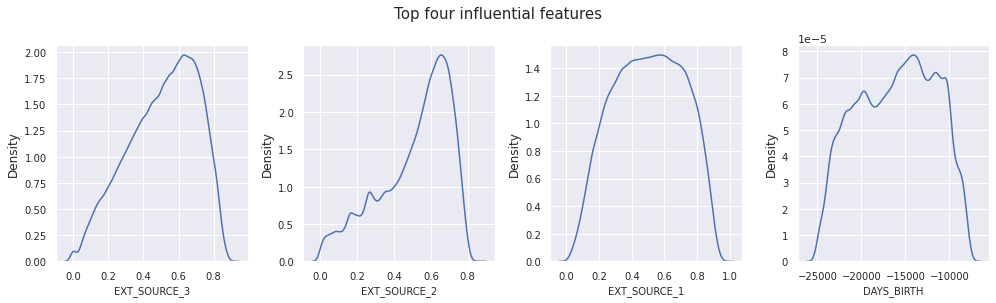

In [ ]:
sns.set_theme(style="darkgrid")

fig,(ax1,ax2,ax3,ax4) =plt.subplots(nrows=1,ncols=4,figsize=(14,4))

sns.kdeplot(df['EXT_SOURCE_3'], color='b', Label='defaulted', ax=ax1)
ax1.tick_params(labelsize=10)
ax1.set_xlabel('EXT_SOURCE_3', size=10)


sns.kdeplot(df['EXT_SOURCE_2'], color='b', Label='defaulted', ax=ax2)
ax2.tick_params(labelsize=10)
ax2.set_xlabel('EXT_SOURCE_2', size=10)

sns.kdeplot(df['EXT_SOURCE_1'], color='b', Label='defaulted', ax=ax3)
ax3.tick_params(labelsize=10)
ax3.set_xlabel('EXT_SOURCE_1', size=10)

sns.kdeplot(df['DAYS_BIRTH'], color='b', Label='defaulted', ax=ax4)
ax4.tick_params(labelsize=10)
ax4.set_xlabel('DAYS_BIRTH', size=10)

plt.suptitle("Top four influential features", y=1.05,fontsize=15)

fig.tight_layout()

plt.savefig('influential_1.jpg')

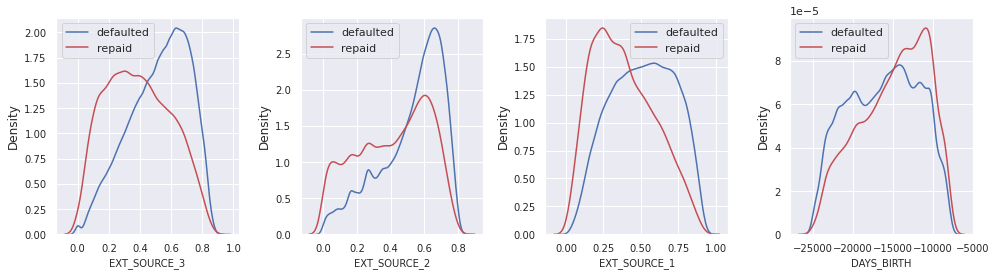

In [ ]:
sns.set_theme(style="darkgrid")

fig,(ax1,ax2,ax3,ax4) =plt.subplots(nrows=1,ncols=4,figsize=(14,4))

sns.kdeplot(df0['EXT_SOURCE_3'], color='b', Label='defaulted', ax=ax1)
sns.kdeplot(df1['EXT_SOURCE_3'], color='r', Label='repaid', ax=ax1)
ax1.tick_params(labelsize=10)
ax1.set_xlabel('EXT_SOURCE_3', size=10)
ax1.legend()



sns.kdeplot(df0['EXT_SOURCE_2'], color='b', Label='defaulted', ax=ax2)
sns.kdeplot(df1['EXT_SOURCE_2'], color='r', Label='repaid', ax=ax2)
ax2.tick_params(labelsize=10)
ax2.set_xlabel('EXT_SOURCE_2', size=10)
ax2.legend()


sns.kdeplot(df0['EXT_SOURCE_1'], color='b', Label='defaulted', ax=ax3)
sns.kdeplot(df1['EXT_SOURCE_1'], color='r', Label='repaid', ax=ax3)
ax3.tick_params(labelsize=10)
ax3.set_xlabel('EXT_SOURCE_1', size=10)
ax3.legend()


sns.kdeplot(df0['DAYS_BIRTH'], color='b', Label='defaulted', ax=ax4)
sns.kdeplot(df1['DAYS_BIRTH'], color='r', Label='repaid', ax=ax4)
ax4.tick_params(labelsize=10)
ax4.set_xlabel('DAYS_BIRTH', size=10)
ax4.legend()

fig.tight_layout()
plt.savefig('influential_2.jpg')

In [ ]:
df['ORGANIZATION_TYPE'].value_counts()

Business Entity Type 3    67992
XNA                       55374
Self-employed             38412
Other                     16683
Medicine                  11193
Business Entity Type 2    10553
Government                10404
School                     8893
Trade: type 7              7831
Kindergarten               6880
Construction               6721
Business Entity Type 1     5984
Transport: type 4          5398
Trade: type 3              3492
Industry: type 9           3368
Industry: type 3           3278
Security                   3247
Housing                    2958
Industry: type 11          2704
Military                   2634
Bank                       2507
Agriculture                2454
Police                     2341
Transport: type 2          2204
Postal                     2157
Security Ministries        1974
Trade: type 2              1900
Restaurant                 1811
Services                   1575
University                 1327
Industry: type 7           1307
Transpor

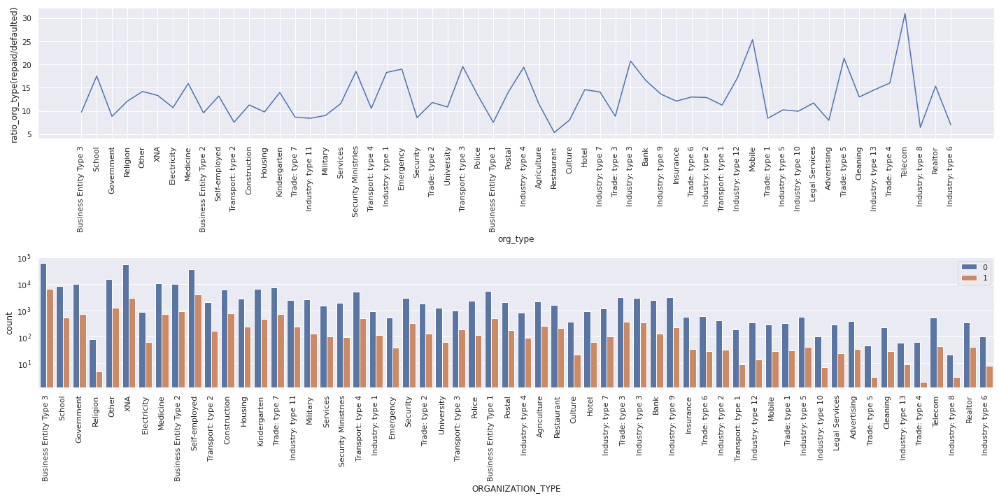

<Figure size 1440x360 with 0 Axes>

In [ ]:
# distribution of organization_type based on target
fig, (ax1,ax2) =plt.subplots(nrows=2,ncols=1,figsize=(20,10))
plt.figure(figsize=(20,5))
sns.countplot(x='ORGANIZATION_TYPE', hue='TARGET', data=df, ax=ax1)
ax1.set_yscale('log')
ax1.legend()
ax1.set_xticklabels(labels=list(df['ORGANIZATION_TYPE'].unique()),rotation='vertical')

#ratio of the clients associated with each organization type
org_type_0=pd.DataFrame(df0['ORGANIZATION_TYPE'].value_counts()).reset_index()
org_type_0.columns=['org_type', 'counts_0']

org_type_1=pd.DataFrame(df1['ORGANIZATION_TYPE'].value_counts()).reset_index()
org_type_1.columns=['org_type', 'counts_1']

org_type=org_type_0.merge(org_type_1,how='outer',on='org_type')

org_type['ratio_org_type(repaid/defaulted)']=org_type['counts_0']/org_type['counts_1']


sns.lineplot(x='org_type',y='ratio_org_type(repaid/defaulted)', data=org_type, ax=ax2)
ax2.set_xticklabels(labels=list(df['ORGANIZATION_TYPE'].unique()),rotation='vertical')

plt.suptitle("Distribution of organization types", y=1.05,fontsize=15)

fig.tight_layout()

fig.savefig('influential_3.jpg')


**Target highly dependens on Org_type** 

In [ ]:
df['NAME_INCOME_TYPE'].value_counts()

Working                 158774
Commercial associate     71617
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64

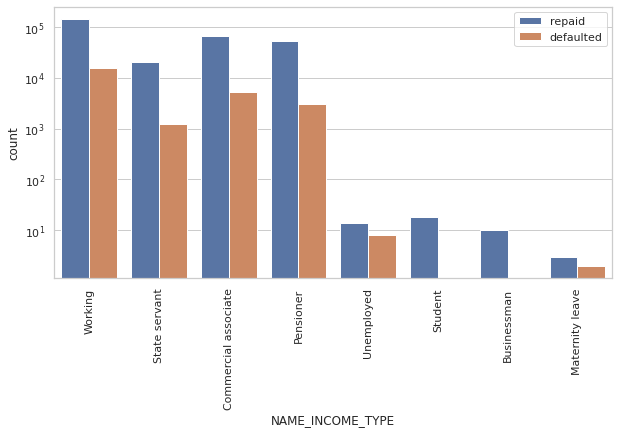

In [ ]:
plt.figure(figsize=(10,5))
_=sns.countplot(x='NAME_INCOME_TYPE', hue='TARGET', data=df)
_=plt.yscale('log')
_=plt.legend(labels=['repaid','defaulted'])
_=plt.xticks(rotation='vertical')

**Target highly dependens on income_type, almost all the Businessmans and Students have repaid the loan.** 

## 4) Inferential statistics

#### 4.1 Feature association with Target

In [ ]:
numerical_features = list(df.drop('SK_ID_CURR', axis=1)._get_numeric_data().columns)
categorical_features = list(df.drop('SK_ID_CURR', axis=1).columns.difference(numerical_features))
print('total no. of numerical features: ' + str(len(numerical_features)))
print('Numerical_features are')
print(numerical_features)
print('\n')
print('total no. of categorical features: ' + str(len(categorical_features)))
print('Categorical_features are')
print(categorical_features)


total no. of numerical features: 70
Numerical_features are
['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'CNT_FAM_MEMBERS', 'HOUR_APPR_PROCESS_START', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 

##### 4.1.1 Categorical variables

In [ ]:
from scipy.stats import chi2_contingency 

def association_with_target(cat_features):
  features=[]
  list_p_values=[]
  association=[]
  for i in cat_features:
    crosstab = pd.crosstab(df_cat[i], df_cat['TARGET'])

    stat, p, dof, expected = chi2_contingency(crosstab) 

    # interpret p-value 
    alpha = 0.01
    if p <= alpha: 
        association.append('Dependent')

    else: 
      association.append('Independent')

    features.append(i)
    list_p_values.append(p)

  df_association=pd.DataFrame(list(zip(features, list_p_values , association)), columns=['features','p value','association with target'])
  return df_association

df_association_cat=association_with_target(categorical_features)
df_association_cat=df_association_cat.sort_values(by='p value', ascending=True).reset_index(drop=True)
df_association_cat

,features,p value,association with target
0,TARGET,0.000000e+00,Dependent
1,ORGANIZATION_TYPE,5.224541e-299,Dependent
2,OCCUPATION_TYPE,3.784500e-288,Dependent
3,NAME_INCOME_TYPE,1.928146e-266,Dependent
4,REGION_RATING_CLIENT_W_CITY,5.055715e-249,Dependent
5,REGION_RATING_CLIENT,1.828316e-232,Dependent
6,NAME_EDUCATION_TYPE,2.447681e-219,Dependent
7,CODE_GENDER,1.129022e-200,Dependent
8,REG_CITY_NOT_WORK_CITY,7.981277e-176,Dependent
9,FLAG_EMP_PHONE,2.530606e-143,Dependent


##### 4.1.2  Numerical variables

In [ ]:
'TARGET' in numerical_features

False

In [ ]:
df_num['TARGET']=df['TARGET']

In [ ]:
def association_numeric (num_features):
    features=[]
    list_p_values=[]
    association=[]

    for i in num_features:
      clf = MonotonicBinning(force_bins=9)
      clf.fit(df_num[[i]], df_num['TARGET'].values)
      bins=list(clf.bins[i])
      df_num['Binned'] = pd.cut(df_num[i],bins=bins)

    
      crosstab = pd.crosstab(df_num['Binned'], df_num['TARGET'])
      stat, p, dof, expected = chi2_contingency(crosstab) 


      # interpret p-value 
      alpha = 0.01
      if p <= alpha: 
        association.append('Dependent')
      else: 
        association.append('Independent')

      features.append(i)
      list_p_values.append(p)

  # create df 
    df_association=pd.DataFrame(list(zip(features, list_p_values , association)), columns=['features','p value','association with target'])
    return df_association.sort_values(by='association with target',ascending=False)

df_association_num=association_numeric(numerical_features).sort_values(by='p value')
df_association_num


,features,p value,association with target
14,EXT_SOURCE_2,0.000000,Dependent
15,EXT_SOURCE_3,0.000000,Dependent
7,DAYS_EMPLOYED,0.000000,Dependent
6,DAYS_BIRTH,0.000000,Dependent
4,AMT_GOODS_PRICE,0.000000,Dependent
...,...,...,...
28,NONLIVINGAPARTMENTS_AVG,0.020004,Independent
66,AMT_REQ_CREDIT_BUREAU_WEEK,0.421772,Independent
65,AMT_REQ_CREDIT_BUREAU_DAY,0.573504,Independent
0,CNT_CHILDREN,0.929811,Independent


In [ ]:
df_association=pd.concat([df_association_cat,df_association_num], ignore_index=True).sort_values(by='p value', ascending=True)
df_association

,features,p value,association with target
0,TARGET,0.000000,Dependent
53,DAYS_EMPLOYED,0.000000,Dependent
54,DAYS_BIRTH,0.000000,Dependent
55,AMT_GOODS_PRICE,0.000000,Dependent
56,EXT_SOURCE_1,0.000000,Dependent
...,...,...,...
48,FLAG_CONT_MOBILE,0.897699,Independent
49,FLAG_DOCUMENT_10,0.928028,Independent
119,CNT_CHILDREN,0.929811,Independent
120,AMT_REQ_CREDIT_BUREAU_HOUR,0.932787,Independent


In [ ]:
df_association['association with target'].value_counts()

Dependent      97
Independent    24
Name: association with target, dtype: int64

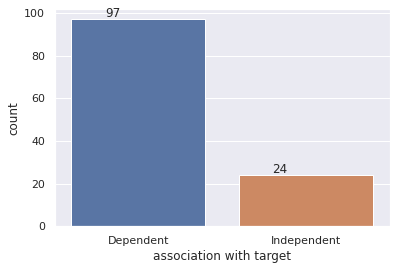

In [ ]:
plt.figure(figsize=(6,4))
ax=sns.countplot(x='association with target', data=df_association)
for p in ax.patches:
        ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.2, p.get_height()+1))

plt.savefig('chisquare.jpg')


In [ ]:
feature_selection=df_association.merge(IV,how='outer', on='features').sort_values(by='information_value', ascending=False).reset_index(drop=True)
feature_selection

,features,p value,association with target,information_value
0,EXT_SOURCE_3,0.00E+00,Dependent,2.70E-01
1,EXT_SOURCE_2,0.00E+00,Dependent,2.47E-01
2,EXT_SOURCE_1,0.00E+00,Dependent,1.24E-01
3,OCCUPATION_TYPE,3.78E-288,Dependent,8.29E-02
4,DAYS_BIRTH,0.00E+00,Dependent,7.57E-02
...,...,...,...,...
116,FLAG_DOCUMENT_4,2.65E-01,Independent,7.82E-09
117,FLAG_DOCUMENT_10,9.28E-01,Independent,6.13E-10
118,FLAG_DOCUMENT_12,3.80E-01,Independent,5.01E-11
119,FLAG_MOBIL,1.24E-01,Independent,1.25E-11


In [ ]:
#influential features by IV value
useful_feature_list

['EXT_SOURCE_3',
 'EXT_SOURCE_2',
 'EXT_SOURCE_1',
 'OCCUPATION_TYPE',
 'DAYS_BIRTH',
 'ORGANIZATION_TYPE',
 'NAME_INCOME_TYPE',
 'REGION_RATING_CLIENT_W_CITY',
 'NAME_EDUCATION_TYPE',
 'AMT_GOODS_PRICE',
 'REGION_RATING_CLIENT',
 'DAYS_EMPLOYED',
 'DAYS_LAST_PHONE_CHANGE',
 'CODE_GENDER',
 'DAYS_ID_PUBLISH',
 'FLOORSMAX_AVG',
 'FLOORSMAX_MEDI',
 'FLOORSMAX_MODE',
 'FLAG_EMP_PHONE',
 'REG_CITY_NOT_WORK_CITY',
 'TOTALAREA_MODE',
 'AMT_CREDIT',
 'LIVINGAREA_AVG',
 'ELEVATORS_AVG',
 'LIVINGAREA_MEDI',
 'ELEVATORS_MEDI',
 'ELEVATORS_MODE',
 'LIVINGAREA_MODE',
 'FLAG_DOCUMENT_3',
 'APARTMENTS_AVG',
 'APARTMENTS_MEDI',
 'APARTMENTS_MODE',
 'WALLSMATERIAL_MODE',
 'ENTRANCES_AVG',
 'ENTRANCES_MEDI',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'ENTRANCES_MODE',
 'EMERGENCYSTATE_MODE',
 'HOUSETYPE_MODE',
 'REG_CITY_NOT_LIVE_CITY',
 'NONLIVINGAREA_AVG',
 'NAME_FAMILY_STATUS',
 'NONLIVINGAREA_MEDI',
 'NONLIVINGAREA_MODE',
 'BASEMENTAREA_AVG',


In [ ]:
#influential feratures by chi-square test
associated_features=list(df_association[df_association['association with target']=='Dependent']['features'].values)
associated_features

['EXT_SOURCE_2',
 'EXT_SOURCE_1',
 'AMT_GOODS_PRICE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'EXT_SOURCE_3',
 'TARGET',
 'ORGANIZATION_TYPE',
 'OCCUPATION_TYPE',
 'NAME_INCOME_TYPE',
 'REGION_RATING_CLIENT_W_CITY',
 'REGION_RATING_CLIENT',
 'NAME_EDUCATION_TYPE',
 'AMT_CREDIT',
 'DAYS_LAST_PHONE_CHANGE',
 'CODE_GENDER',
 'DAYS_ID_PUBLISH',
 'REG_CITY_NOT_WORK_CITY',
 'FLAG_EMP_PHONE',
 'REGION_POPULATION_RELATIVE',
 'REG_CITY_NOT_LIVE_CITY',
 'FLAG_DOCUMENT_3',
 'AMT_ANNUITY',
 'DAYS_REGISTRATION',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'LIVE_CITY_NOT_WORK_CITY',
 'OWN_CAR_AGE',
 'NAME_CONTRACT_TYPE',
 'FLOORSMAX_AVG',
 'FLOORSMAX_MEDI',
 'FLOORSMAX_MODE',
 'TOTALAREA_MODE',
 'FLAG_DOCUMENT_6',
 'FLAG_WORK_PHONE',
 'LIVINGAREA_AVG',
 'LIVINGAREA_MEDI',
 'LIVINGAREA_MODE',
 'APARTMENTS_AVG',
 'HOUR_APPR_PROCESS_START',
 'APARTMENTS_MEDI',
 'AMT_INCOME_TOTAL',
 'APARTMENTS_MODE',
 'FLAG_PHONE',
 'FLAG_OWN_CAR',
 'FLOORSMIN_MEDI',
 'FLOORSMIN_AVG',
 'FLOORSMIN_MODE',
 'WALLSMATERIAL_MOD

In [ ]:
[i for i in useful_feature_list if i not in associated_features]

0


[]

**Information value and Chi-square test are in agreement to determine top 50 features with optimum predicting power** 

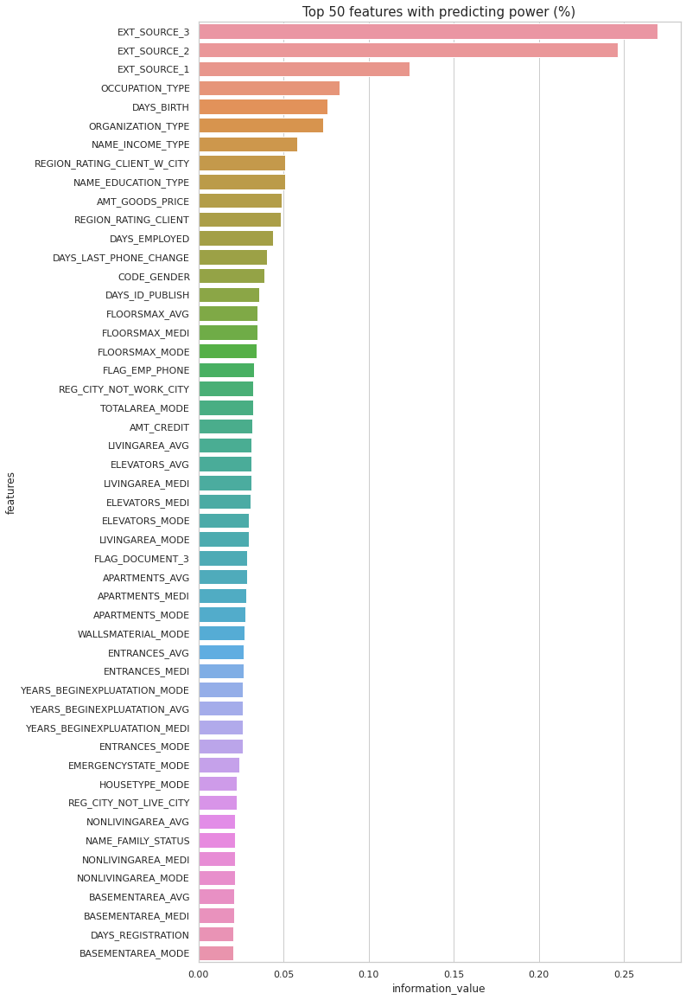

In [ ]:
plt.figure(figsize=(10,20))
ax=sns.barplot(y='features',x='information_value', data=useful_features, orient='h')
_=ax.set_title('Top 50 features with predicting power (%)', fontsize=15)

## Brief overview of Additional Data related to the Applicants


## 5) Bureau
This contains data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.

In [ ]:
df_bureau=pd.read_csv('/content/drive/My Drive/Colab Notebooks/capstone two/home-credit-default-risk/bureau.csv')
df_bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [ ]:
df_bureau.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Non-Null Count    Dtype  
---  ------                  --------------    -----  
 0   SK_ID_CURR              1716428 non-null  int64  
 1   SK_ID_BUREAU            1716428 non-null  int64  
 2   CREDIT_ACTIVE           1716428 non-null  object 
 3   CREDIT_CURRENCY         1716428 non-null  object 
 4   DAYS_CREDIT             1716428 non-null  int64  
 5   CREDIT_DAY_OVERDUE      1716428 non-null  int64  
 6   DAYS_CREDIT_ENDDATE     1610875 non-null  float64
 7   DAYS_ENDDATE_FACT       1082775 non-null  float64
 8   AMT_CREDIT_MAX_OVERDUE  591940 non-null   float64
 9   CNT_CREDIT_PROLONG      1716428 non-null  int64  
 10  AMT_CREDIT_SUM          1716415 non-null  float64
 11  AMT_CREDIT_SUM_DEBT     1458759 non-null  float64
 12  AMT_CREDIT_SUM_LIMIT    1124648 non-null  float64
 13  AMT_CREDIT_SUM_OVERDUE  1716428 non-null  float64
 14  CR

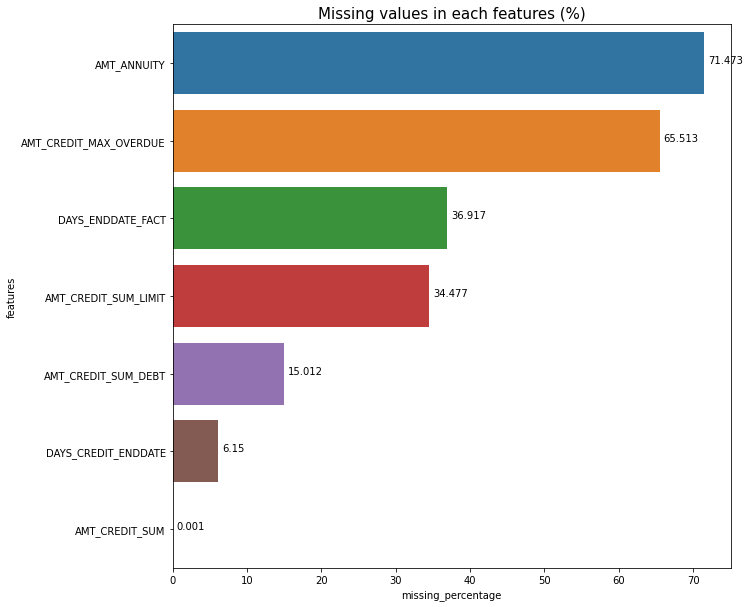

In [ ]:
missing_values=pd.DataFrame(df_bureau.isnull().sum()*100/len(df_bureau)).reset_index()
missing_values.columns=['features','missing_percentage']

missing_values=missing_values[missing_values['missing_percentage']>0].sort_values(by='missing_percentage', ascending=False).reset_index(drop=True)
missing_values

plt.figure(figsize=(10,10))
ax=sns.barplot(y="features", x="missing_percentage", data=missing_values, orient='h')
for p in ax.patches:
        x = p.get_x() + p.get_width() + 0.5
        y = p.get_y() + p.get_height()/2
        ax.annotate(round(p.get_width(),3), (x, y))

_=ax.set_title('Missing values in each features (%)', fontsize=15)



## 6) Bureau Balance
This is a monthly data about the previous credits of the applicants in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.

In [ ]:
df_bureau_balance=pd.read_csv('/content/drive/My Drive/Colab Notebooks/capstone two/home-credit-default-risk/bureau_balance.csv')
df_bureau_balance.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [ ]:
df_bureau_balance.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Non-Null Count     Dtype 
---  ------          --------------     ----- 
 0   SK_ID_BUREAU    27299925 non-null  int64 
 1   MONTHS_BALANCE  27299925 non-null  int64 
 2   STATUS          27299925 non-null  object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB


## 7) Credit Card Balance
This is monthly data about previous credit cards applicants have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.

In [ ]:
df_cc_balance=pd.read_csv('/content/drive/My Drive/Colab Notebooks/capstone two/home-credit-default-risk/credit_card_balance.csv')
df_cc_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.0,1800.0,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.0,2250.0,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.0,2250.0,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.0,11925.0,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.0,27000.0,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


In [ ]:
df_cc_balance.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Non-Null Count    Dtype  
---  ------                      --------------    -----  
 0   SK_ID_PREV                  3840312 non-null  int64  
 1   SK_ID_CURR                  3840312 non-null  int64  
 2   MONTHS_BALANCE              3840312 non-null  int64  
 3   AMT_BALANCE                 3840312 non-null  float64
 4   AMT_CREDIT_LIMIT_ACTUAL     3840312 non-null  int64  
 5   AMT_DRAWINGS_ATM_CURRENT    3090496 non-null  float64
 6   AMT_DRAWINGS_CURRENT        3840312 non-null  float64
 7   AMT_DRAWINGS_OTHER_CURRENT  3090496 non-null  float64
 8   AMT_DRAWINGS_POS_CURRENT    3090496 non-null  float64
 9   AMT_INST_MIN_REGULARITY     3535076 non-null  float64
 10  AMT_PAYMENT_CURRENT         3072324 non-null  float64
 11  AMT_PAYMENT_TOTAL_CURRENT   3840312 non-null  float64
 12  AMT_RECEIVABLE_PRINCIPAL    3840312 non-null  float64
 1

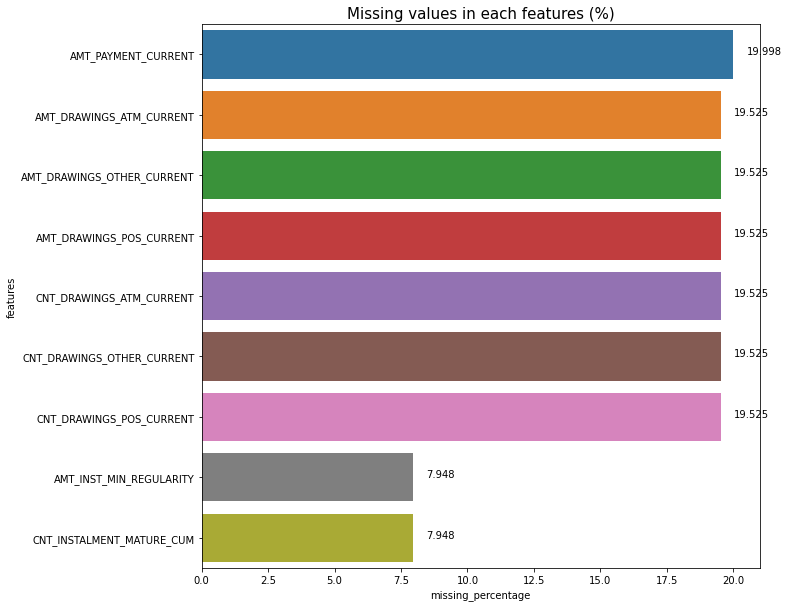

In [ ]:
missing_values=pd.DataFrame(df_cc_balance.isnull().sum()*100/len(df_cc_balance)).reset_index()
missing_values.columns=['features','missing_percentage']

missing_values=missing_values[missing_values['missing_percentage']>0].sort_values(by='missing_percentage', ascending=False).reset_index(drop=True)
missing_values

plt.figure(figsize=(10,10))
ax=sns.barplot(y="features", x="missing_percentage", data=missing_values, orient='h')
for p in ax.patches:
        x = p.get_x() + p.get_width() + 0.5
        y = p.get_y() + p.get_height()/2
        ax.annotate(round(p.get_width(),3), (x, y))

_=ax.set_title('Missing values in each features (%)', fontsize=15)



## 8) Installments Payment
This is payment history of the applicants for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

In [ ]:
df_installments_payments=pd.read_csv('/content/drive/My Drive/Colab Notebooks/capstone two/home-credit-default-risk/installments_payments.csv')
df_installments_payments.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


In [ ]:
df_installments_payments.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Non-Null Count     Dtype  
---  ------                  --------------     -----  
 0   SK_ID_PREV              13605401 non-null  int64  
 1   SK_ID_CURR              13605401 non-null  int64  
 2   NUM_INSTALMENT_VERSION  13605401 non-null  float64
 3   NUM_INSTALMENT_NUMBER   13605401 non-null  int64  
 4   DAYS_INSTALMENT         13605401 non-null  float64
 5   DAYS_ENTRY_PAYMENT      13602496 non-null  float64
 6   AMT_INSTALMENT          13605401 non-null  float64
 7   AMT_PAYMENT             13602496 non-null  float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB


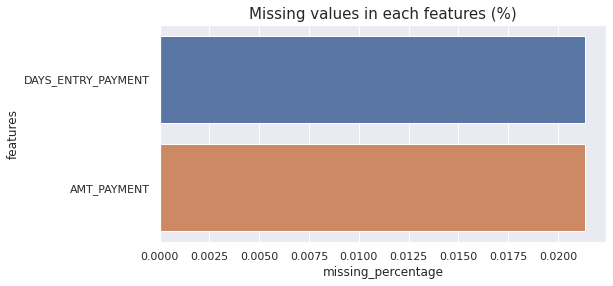

In [ ]:
missing_values=pd.DataFrame(df_installments_payments.isnull().sum()*100/len(df_installments_payments)).reset_index()
missing_values.columns=['features','missing_percentage']

missing_values=missing_values[missing_values['missing_percentage']>0].sort_values(by='missing_percentage', ascending=False).reset_index(drop=True)
missing_values

plt.figure(figsize=(8,4))
ax=sns.barplot(y="features", x="missing_percentage", data=missing_values, orient='h')

_=ax.set_title('Missing values in each features (%)', fontsize=15)



## 9) POS_CASH_balance
This is monthly data about previous point of sale or cash loans applicants have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.

In [ ]:
df_POS_CASH_balance=pd.read_csv('/content/drive/My Drive/Colab Notebooks/capstone two/home-credit-default-risk/POS_CASH_balance.csv')
df_POS_CASH_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [ ]:
df_POS_CASH_balance.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Non-Null Count     Dtype  
---  ------                 --------------     -----  
 0   SK_ID_PREV             10001358 non-null  int64  
 1   SK_ID_CURR             10001358 non-null  int64  
 2   MONTHS_BALANCE         10001358 non-null  int64  
 3   CNT_INSTALMENT         9975287 non-null   float64
 4   CNT_INSTALMENT_FUTURE  9975271 non-null   float64
 5   NAME_CONTRACT_STATUS   10001358 non-null  object 
 6   SK_DPD                 10001358 non-null  int64  
 7   SK_DPD_DEF             10001358 non-null  int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB


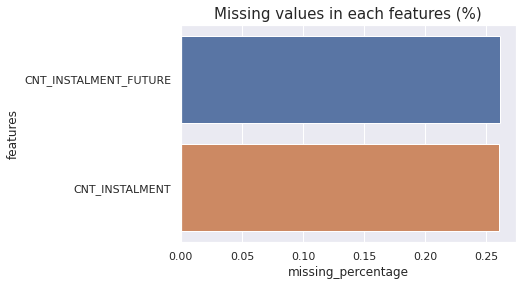

In [ ]:
missing_values=pd.DataFrame(df_POS_CASH_balance.isnull().sum()*100/len(df_POS_CASH_balance)).reset_index()
missing_values.columns=['features','missing_percentage']

missing_values=missing_values[missing_values['missing_percentage']>0].sort_values(by='missing_percentage', ascending=False).reset_index(drop=True)
missing_values

plt.figure(figsize=(6,4))
ax=sns.barplot(y="features", x="missing_percentage", data=missing_values, orient='h')

_=ax.set_title('Missing values in each features (%)', fontsize=15)

